# Intel Image Classification — CNN Architecture Comparison

A systematic comparison of CNN architectural patterns (batch norm, residual connections,
depthwise-separable convolutions) plus a from-scratch Xception-style network and
transfer learning with a pretrained Xception-41 backbone, evaluated on the
[Intel Image Classification](https://www.kaggle.com/datasets/puneet6060/intel-image-classification) dataset (6 scene classes, ~14k training images).


In [3]:
import keras
import tensorflow as tf
from keras import layers
import matplotlib.pyplot as plt
import pandas as pd

## Kaggle Authentication

Run the cell below and follow the interactive login prompt.

In [4]:
import kagglehub
kagglehub.login()

In [5]:
dataset = kagglehub.dataset_download('puneet6060/intel-image-classification')
print(dataset)

Using Colab cache for faster access to the 'intel-image-classification' dataset.
/kaggle/input/intel-image-classification


In [6]:
# Data Preprocessing using keras.image_dataset_from_directory
from pathlib import Path
from keras.utils import image_dataset_from_directory

batch_size = 32
image_size = (150, 150)
seed = 42  # fixed seed -> reproducible train/val split across all from-scratch stages

dataset_path = Path(dataset)
train_dir = dataset_path / "seg_train" / "seg_train"
test_dir = dataset_path / "seg_test" / "seg_test"

train_dataset = image_dataset_from_directory(
    train_dir, validation_split=0.2, subset="training",
    seed=seed, image_size=image_size, batch_size=batch_size,
)
val_dataset = image_dataset_from_directory(
    train_dir, validation_split=0.2, subset="validation",
    seed=seed, image_size=image_size, batch_size=batch_size,
)
test_dataset = image_dataset_from_directory(
    test_dir, image_size=image_size, batch_size=batch_size, shuffle=False,
)

print(train_dataset.class_names)

Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.
Found 3000 files belonging to 6 classes.
['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


## Helper functions

Every stage below follows the same pattern: compile -> checkpoint best-val-loss weights ->
fit -> plot curves -> reload best checkpoint -> evaluate on the held-out test set.

In [7]:
results = {}  # collects test_acc / test_loss per stage for the final summary table

def plot_history(history, title=""):
    acc, val_acc = history.history["accuracy"], history.history["val_accuracy"]
    loss, val_loss = history.history["loss"], history.history["val_loss"]
    epochs_range = range(1, len(acc) + 1)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    axes[0].plot(epochs_range, acc, "r--", label="Training Accuracy")
    axes[0].plot(epochs_range, val_acc, "b", label="Validation Accuracy")
    axes[0].set_title(f"{title} — Accuracy")
    axes[0].legend()

    axes[1].plot(epochs_range, loss, "r--", label="Training Loss")
    axes[1].plot(epochs_range, val_loss, "b", label="Validation Loss")
    axes[1].set_title(f"{title} — Loss")
    axes[1].legend()

    plt.tight_layout()
    plt.show()


def train_and_evaluate(model, name, train_ds, val_ds, test_ds, epochs=15, learning_rate=1e-3):
    """Compile, train with a best-checkpoint callback, plot curves, then evaluate the
    best checkpoint (not the final-epoch weights) on the test set."""
    model.compile(
        loss="sparse_categorical_crossentropy",
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        metrics=["accuracy"],
    )

    checkpoint_path = f"{name}.keras"
    callbacks = [
        keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path, save_best_only=True, monitor="val_loss",
        )
    ]

    history = model.fit(
        train_ds, epochs=epochs, validation_data=val_ds, callbacks=callbacks,
    )

    plot_history(history, title=name)

    best_model = keras.models.load_model(checkpoint_path)
    test_loss, test_acc = best_model.evaluate(test_ds)
    print(f"[{name}] Test accuracy: {test_acc:.3f} | Test loss: {test_loss:.3f}")

    results[name] = {"Test Accuracy": round(test_acc, 3), "Test Loss": round(test_loss, 3)}
    return history, best_model

# 1. Baseline CNN

In [8]:
keras.backend.clear_session()

inputs = keras.Input(shape=(150, 150, 3))
x = layers.Rescaling(1.0 / 255)(inputs)
x = layers.Conv2D(64, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(128, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(256, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(512, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 148, 148, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,554,054 (5.93 MB)

 Trainable params: 1,554,054 (5.93 MB)

 Non-trainable params: 0 (0.00 B)

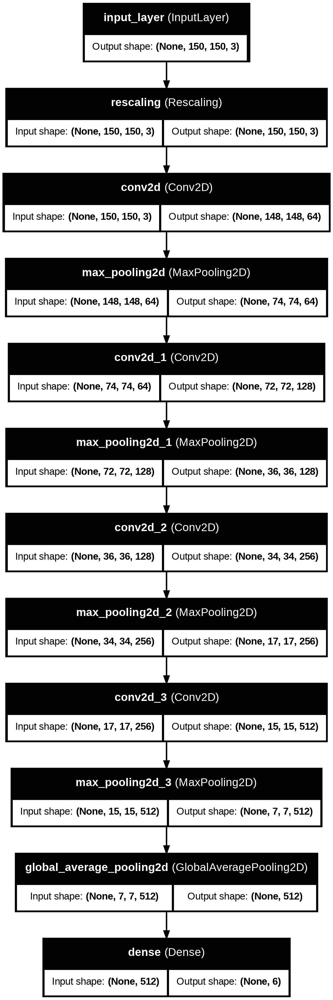

In [9]:
keras.utils.plot_model(model, "Base_CNN_Model.png", show_shapes=True, show_layer_names=True)

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 60s 144ms/step - accuracy: 0.5055 - loss: 1.1703 - val_accuracy: 0.6030 - val_loss: 1.0046
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - accuracy: 0.6936 - loss: 0.8184 - val_accuracy: 0.7427 - val_loss: 0.6883
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.7701 - loss: 0.6394 - val_accuracy: 0.7887 - val_loss: 0.5944
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.7935 - loss: 0.5703 - val_accuracy: 0.8040 - val_loss: 0.5132
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.8142 - loss: 0.5199 - val_accuracy: 0.7944 - val_loss: 0.5858
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - accuracy: 0.8280 - loss: 0.4750 - val_accuracy: 0.8215 - val_loss: 0.5221
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.8476 - loss: 0.4316 - val_accuracy: 0.8239 - val_loss: 0.4838
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - accuracy: 0.8550 - loss: 0.4094 -

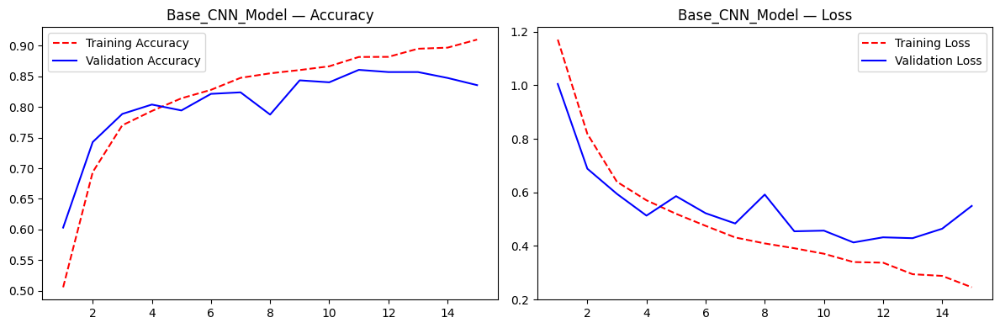

94/94 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8563 - loss: 0.4251
[Base_CNN_Model] Test accuracy: 0.856 | Test loss: 0.425


In [10]:
history, best_model = train_and_evaluate(model, "Base_CNN_Model", train_dataset, val_dataset, test_dataset)

# 2. + Batch Normalization

In [11]:
keras.backend.clear_session()

inputs = keras.Input(shape=(150, 150, 3))
x = layers.Rescaling(1.0 / 255)(inputs)

for filters in (64, 128, 256, 512):
    x = layers.Conv2D(filters, kernel_size=3, use_bias=False)(x)
    x = layers.BatchNormalization(momentum=0.9)(x)  # momentum=0.9, not the Keras default
    x = layers.Activation("relu")(x)                 # 0.99 -- see README for why
    x = layers.MaxPooling2D(pool_size=2)(x)

x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 148, 148, 64)   │         1,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 148, 148, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 148, 148, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 72, 72, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 72, 72, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 256)    │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 34, 34, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 34, 34, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 512)    │     1,179,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 15, 15, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 15, 15, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,556,934 (5.94 MB)

 Trainable params: 1,555,014 (5.93 MB)

 Non-trainable params: 1,920 (7.50 KB)

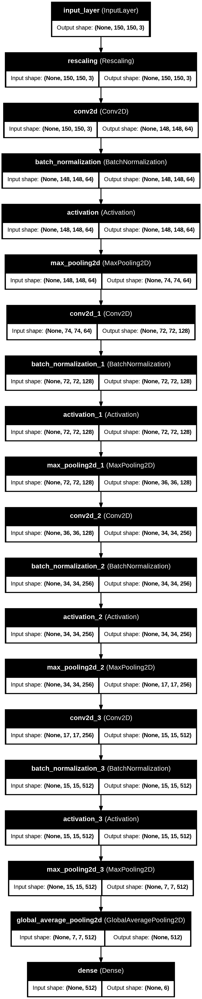

In [12]:
keras.utils.plot_model(model, "Batch_Normalization_Added.png", show_shapes=True, show_layer_names=True)

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - accuracy: 0.6952 - loss: 0.8175 - val_accuracy: 0.5777 - val_loss: 1.2953
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7670 - loss: 0.6309 - val_accuracy: 0.6426 - val_loss: 0.9749
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7982 - loss: 0.5563 - val_accuracy: 0.8058 - val_loss: 0.5475
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.8178 - loss: 0.5056 - val_accuracy: 0.7790 - val_loss: 0.6051
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.8227 - loss: 0.4808 - val_accuracy: 0.6803 - val_loss: 0.9915
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.8337 - loss: 0.4560 - val_accuracy: 0.7370 - val_loss: 0.7051
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.8458 - loss: 0.4308 - val_accuracy: 0.7869 - val_loss: 0.6027
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - accuracy: 0.8546 - loss: 0.4050 - 

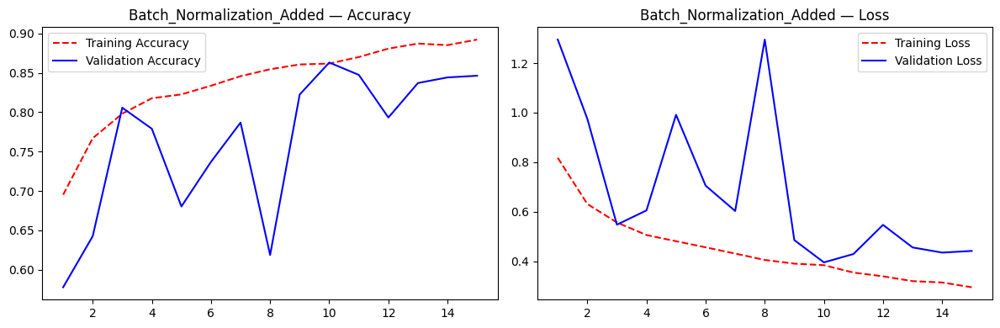

94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.8540 - loss: 0.4299
[Batch_Normalization_Added] Test accuracy: 0.854 | Test loss: 0.430


In [13]:
history, best_model = train_and_evaluate(model, "Batch_Normalization_Added", train_dataset, val_dataset, test_dataset)

# 3. + Residual Connections

In [14]:
keras.backend.clear_session()

inputs = keras.Input(shape=(150, 150, 3))
x = layers.Rescaling(1.0 / 255)(inputs)

for filters in (64, 128, 256, 512):
    residual = x
    x = layers.Conv2D(filters, kernel_size=3, use_bias=False, padding="same")(x)
    x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D(pool_size=2, padding="same")(x)
    residual = layers.Conv2D(filters, 1, strides=2, use_bias=False)(residual)
    residual = layers.BatchNormalization(momentum=0.9)(residual)
    x = layers.add([x, residual])

x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 150, 150,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 150, 150,  │      1,728 │ rescaling[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 150, 150,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 150, 150,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 75, 75,    │        192 │ rescaling[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 75, 75,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 75, 75,    │          0 │ max_pooling2d[0]… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 75, 75,    │     73,728 │ add[0][0]         │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 38, 38,    │      8,192 │ add[0][0]         │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 38, 38,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 38, 38,    │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 38, 38,    │          0 │ max_pooling2d_1[… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 38, 38,    │    294,912 │ add_1[0][0]     

 Total params: 1,732,998 (6.61 MB)

 Trainable params: 1,729,158 (6.60 MB)

 Non-trainable params: 3,840 (15.00 KB)

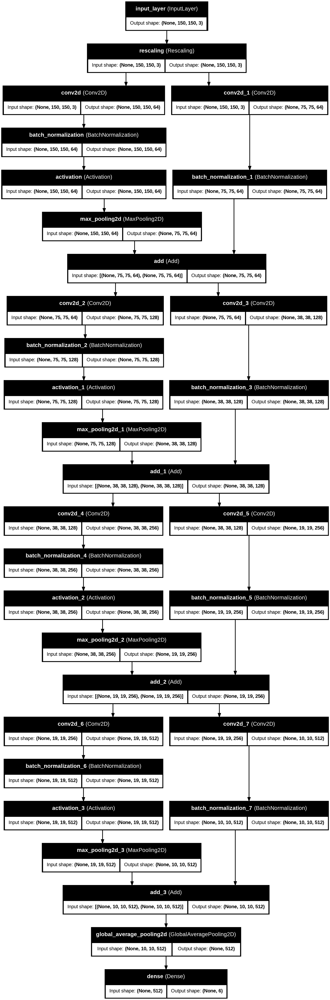

In [15]:
keras.utils.plot_model(model, "Residual_Added.png", show_shapes=True, show_layer_names=True)

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 149ms/step - accuracy: 0.6622 - loss: 0.9281 - val_accuracy: 0.6468 - val_loss: 0.9431
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - accuracy: 0.7410 - loss: 0.7001 - val_accuracy: 0.6828 - val_loss: 0.7986
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - accuracy: 0.7754 - loss: 0.6238 - val_accuracy: 0.7021 - val_loss: 0.8004
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - accuracy: 0.7927 - loss: 0.5624 - val_accuracy: 0.7584 - val_loss: 0.6841
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - accuracy: 0.8132 - loss: 0.5289 - val_accuracy: 0.7922 - val_loss: 0.5270
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - accuracy: 0.8228 - loss: 0.5019 - val_accuracy: 0.6992 - val_loss: 0.8855
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 97ms/step - accuracy: 0.8302 - loss: 0.4798 - val_accuracy: 0.7922 - val_loss: 0.5625
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - accuracy: 0.8383 - loss: 0.4482 

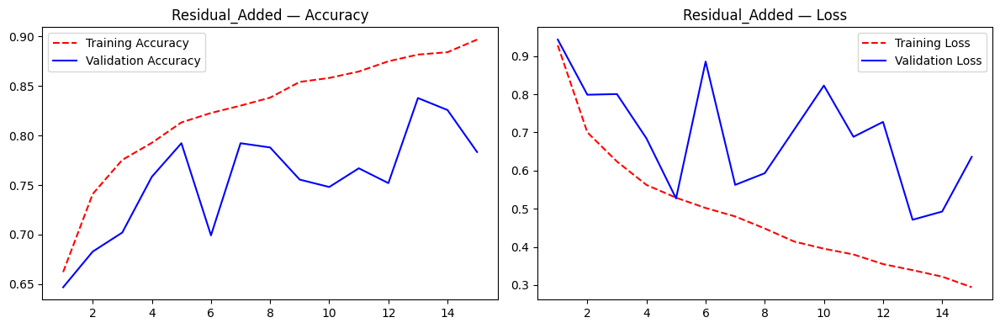

94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.8270 - loss: 0.5089
[Residual_Added] Test accuracy: 0.827 | Test loss: 0.509


In [16]:
history, best_model = train_and_evaluate(model, "Residual_Added", train_dataset, val_dataset, test_dataset)

# 4. + Depthwise-Separable Convolutions

In [17]:
keras.backend.clear_session()

inputs = keras.Input(shape=(150, 150, 3))
x = layers.Rescaling(1.0 / 255)(inputs)

# First block stays a regular Conv2D (only 3 input channels -- little to gain from
# separating spatial/channel mixing this early); later blocks use SeparableConv2D.
residual = x
x = layers.Conv2D(64, kernel_size=3, use_bias=False, padding="same")(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(pool_size=2, padding="same")(x)
residual = layers.Conv2D(64, 1, strides=2, use_bias=False)(residual)
residual = layers.BatchNormalization(momentum=0.9)(residual)
x = layers.add([x, residual])

for filters in (128, 256, 512):
    residual = x
    x = layers.SeparableConv2D(filters, kernel_size=3, use_bias=False, padding="same")(x)
    x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D(pool_size=2, padding="same")(x)
    residual = layers.Conv2D(filters, 1, strides=2, use_bias=False)(residual)
    residual = layers.BatchNormalization(momentum=0.9)(residual)
    x = layers.add([x, residual])

x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 150, 150,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 150, 150,  │      1,728 │ rescaling[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 150, 150,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 150, 150,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 75, 75,    │        192 │ rescaling[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 75, 75,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 75, 75,    │          0 │ max_pooling2d[0]… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d    │ (None, 75, 75,    │      8,768 │ add[0][0]         │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        512 │ separable_conv2d… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 38, 38,    │      8,192 │ add[0][0]         │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 38, 38,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 38, 38,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 38, 38,    │          0 │ max_pooling2d_1[… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_1  │ (None, 38, 38,    │     33,920 │ add_1[0][0]     

 Total params: 360,774 (1.38 MB)

 Trainable params: 356,934 (1.36 MB)

 Non-trainable params: 3,840 (15.00 KB)

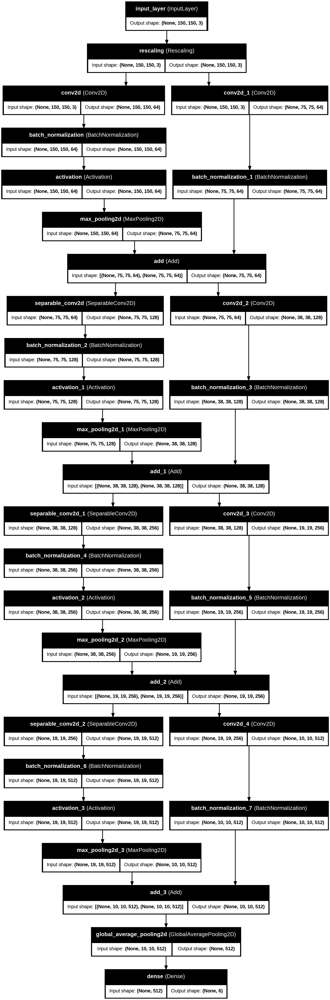

In [18]:
keras.utils.plot_model(model, "Depthwise_Separable_Added.png", show_shapes=True, show_layer_names=True)

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 59s 120ms/step - accuracy: 0.6691 - loss: 0.8783 - val_accuracy: 0.6707 - val_loss: 0.9178
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.7624 - loss: 0.6525 - val_accuracy: 0.7431 - val_loss: 0.7094
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.7927 - loss: 0.5824 - val_accuracy: 0.7815 - val_loss: 0.5895
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8064 - loss: 0.5375 - val_accuracy: 0.7976 - val_loss: 0.5631
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8264 - loss: 0.4897 - val_accuracy: 0.6999 - val_loss: 0.8585
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8368 - loss: 0.4638 - val_accuracy: 0.7655 - val_loss: 0.6104
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8503 - loss: 0.4336 - val_accuracy: 0.7648 - val_loss: 0.6203
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8507 - loss: 0.4162 -

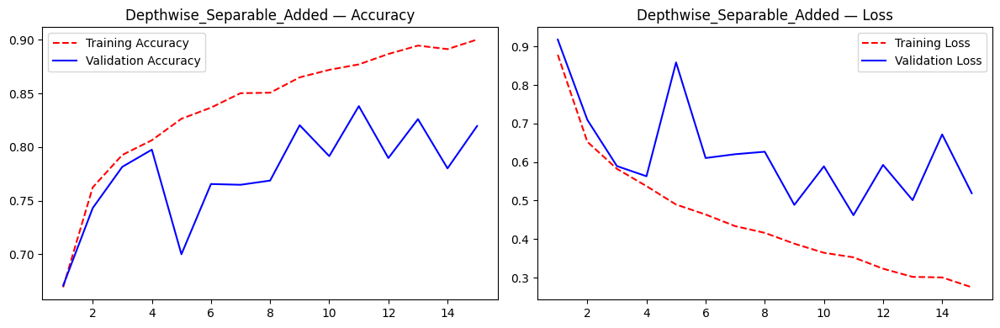

94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - accuracy: 0.8400 - loss: 0.4659
[Depthwise_Separable_Added] Test accuracy: 0.840 | Test loss: 0.466


In [19]:
history, best_model = train_and_evaluate(model, "Depthwise_Separable_Added", train_dataset, val_dataset, test_dataset)

# 5. Xception-Lite (entry / middle / exit flow)

In [20]:
keras.backend.clear_session()

inputs = keras.Input(shape=(150, 150, 3))
x = layers.Rescaling(1.0 / 255)(inputs)

# --- Entry flow ---
x = layers.Conv2D(32, 3, use_bias=False, padding="same")(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(2, padding="same")(x)

x = layers.Conv2D(64, 3, use_bias=False, padding="same")(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)

for filters in (128, 256):
    residual = x
    x = layers.SeparableConv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.Activation("relu")(x)
    x = layers.SeparableConv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.Activation("relu")(x)
    x = layers.MaxPooling2D(2, padding="same")(x)
    residual = layers.Conv2D(filters, 1, strides=2, use_bias=False)(residual)
    residual = layers.BatchNormalization(momentum=0.9)(residual)
    x = layers.add([x, residual])

# --- Middle flow: 4x repeated refinement blocks, no downsampling ---
for _ in range(4):
    residual = x
    for _ in range(3):
        x = layers.SeparableConv2D(256, 3, padding="same", use_bias=False)(x)
        x = layers.BatchNormalization(momentum=0.9)(x)
        x = layers.Activation("relu")(x)
    x = layers.add([x, residual])

# --- Exit flow ---
residual = x
x = layers.SeparableConv2D(512, 3, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)
x = layers.SeparableConv2D(512, 3, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)
x = layers.MaxPooling2D(2, padding="same")(x)
residual = layers.Conv2D(512, 1, strides=2, use_bias=False)(residual)
residual = layers.BatchNormalization(momentum=0.9)(residual)
x = layers.add([x, residual])

x = layers.SeparableConv2D(768, 3, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)
x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 150, 150,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 150, 150,  │        864 │ rescaling[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 150, 150,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 150, 150,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 75, 75,    │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 75, 75,    │     18,432 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d    │ (None, 75, 75,    │      8,768 │ activation_1[0][… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        512 │ separable_conv2d… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_1  │ (None, 75, 75,    │     17,536 │ activation_2[0][… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        512 │ separable_conv2d… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 38, 38,    │      8,192 │ activation_1[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 38, 38,    │          0 │ activation_3[0][

 Total params: 1,962,534 (7.49 MB)

 Trainable params: 1,949,286 (7.44 MB)

 Non-trainable params: 13,248 (51.75 KB)

In [21]:
keras.utils.plot_model(model, "XCeption_Lite_V1.png", show_shapes=True, show_layer_names=True)

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 148s 303ms/step - accuracy: 0.7263 - loss: 0.7347 - val_accuracy: 0.7883 - val_loss: 0.5900
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - accuracy: 0.8245 - loss: 0.4949 - val_accuracy: 0.7726 - val_loss: 0.6229
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - accuracy: 0.8429 - loss: 0.4269 - val_accuracy: 0.8061 - val_loss: 0.5159
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - accuracy: 0.8662 - loss: 0.3666 - val_accuracy: 0.8304 - val_loss: 0.4748
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - accuracy: 0.8891 - loss: 0.3151 - val_accuracy: 0.8435 - val_loss: 0.4225
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - accuracy: 0.9044 - loss: 0.2687 - val_accuracy: 0.8400 - val_loss: 0.4156
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - accuracy: 0.9137 - loss: 0.2385 - val_accuracy: 0.7847 - val_loss: 0.6300
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - accuracy: 0.9315 - loss: 

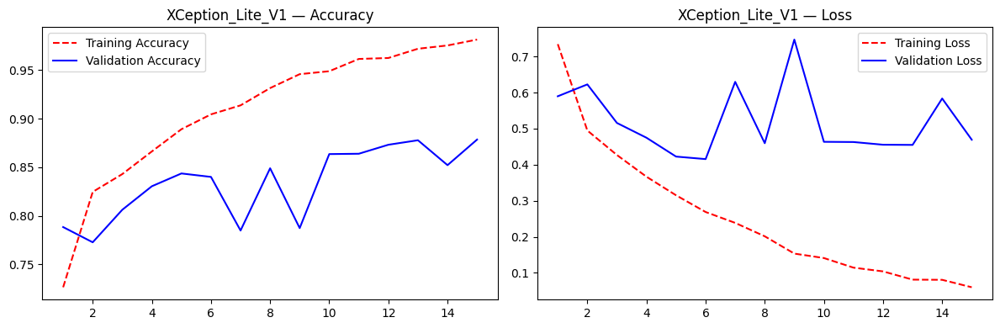

94/94 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - accuracy: 0.8277 - loss: 0.4510
[XCeption_Lite_V1] Test accuracy: 0.828 | Test loss: 0.451


In [22]:
history, best_model = train_and_evaluate(model, "XCeption_Lite_V1", train_dataset, val_dataset, test_dataset)

# 6. Xception-Lite V2 — deeper middle flow + Dropout + Data Augmentation

In [23]:
keras.backend.clear_session()

data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

inputs = keras.Input(shape=(150, 150, 3))
x = data_augmentation(inputs)
x = layers.Rescaling(1.0 / 255)(x)

# --- Entry flow ---
x = layers.Conv2D(32, 3, strides=2, use_bias=False, padding="same")(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)

x = layers.Conv2D(64, 3, use_bias=False, padding="same")(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)

for i, filters in enumerate((128, 256, 512)):
    residual = layers.Conv2D(filters, 1, strides=2, padding="same", use_bias=False)(x)
    residual = layers.BatchNormalization(momentum=0.9)(residual)
    if i > 0:  # first block's main path is already activated coming out of the stem
        x = layers.Activation("relu")(x)
    x = layers.SeparableConv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.Activation("relu")(x)
    x = layers.SeparableConv2D(filters, 3, padding="same", use_bias=False)(x)
    x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.MaxPooling2D(3, strides=2, padding="same")(x)
    x = layers.add([x, residual])

# --- Middle flow: 8x repeated refinement blocks (pre-activation, no downsampling) ---
for _ in range(8):
    residual = x
    for _ in range(3):
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(512, 3, padding="same", use_bias=False)(x)
        x = layers.BatchNormalization(momentum=0.9)(x)
    x = layers.add([x, residual])

# --- Exit flow ---
residual = layers.Conv2D(768, 1, strides=2, padding="same", use_bias=False)(x)
residual = layers.BatchNormalization(momentum=0.9)(residual)
x = layers.Activation("relu")(x)
x = layers.SeparableConv2D(512, 3, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)
x = layers.SeparableConv2D(768, 3, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.MaxPooling2D(3, strides=2, padding="same")(x)
x = layers.add([x, residual])

x = layers.SeparableConv2D(1024, 3, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)
x = layers.SeparableConv2D(1536, 3, padding="same", use_bias=False)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.Activation("relu")(x)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 150, 150,  │          0 │ input_layer[0][0] │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 150, 150,  │          0 │ sequential[0][0]  │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 75, 75,    │        864 │ rescaling[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 75, 75,    │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 75, 75,    │     18,432 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d    │ (None, 75, 75,    │      8,768 │ activation_1[0][… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        512 │ separable_conv2d… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 75, 75,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_1  │ (None, 75, 75,    │     17,536 │ activation_2[0][… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        512 │ separable_conv2d… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 38, 38,    │      8,192 │ activation_1[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 38, 38,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 38, 38,    │        512 │ conv2d_2[0][0]  

 Total params: 10,642,726 (40.60 MB)

 Trainable params: 10,603,366 (40.45 MB)

 Non-trainable params: 39,360 (153.75 KB)

In [24]:
keras.utils.plot_model(model, "XCeption_Lite_V2.png", show_shapes=True, show_layer_names=True)

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 152s 342ms/step - accuracy: 0.6138 - loss: 1.0179 - val_accuracy: 0.6429 - val_loss: 1.0429
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 114s 326ms/step - accuracy: 0.7315 - loss: 0.7382 - val_accuracy: 0.7555 - val_loss: 0.6788
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 115s 328ms/step - accuracy: 0.7693 - loss: 0.6485 - val_accuracy: 0.7744 - val_loss: 0.6414
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 115s 327ms/step - accuracy: 0.7936 - loss: 0.5860 - val_accuracy: 0.8150 - val_loss: 0.5151
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 114s 324ms/step - accuracy: 0.8123 - loss: 0.5405 - val_accuracy: 0.7904 - val_loss: 0.5776
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 144s 330ms/step - accuracy: 0.8209 - loss: 0.5103 - val_accuracy: 0.8225 - val_loss: 0.5051
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 114s 325ms/step - accuracy: 0.8341 - loss: 0.4749 - val_accuracy: 0.7662 - val_loss: 0.6643
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 115s 328ms/step - accuracy: 0.8400 -

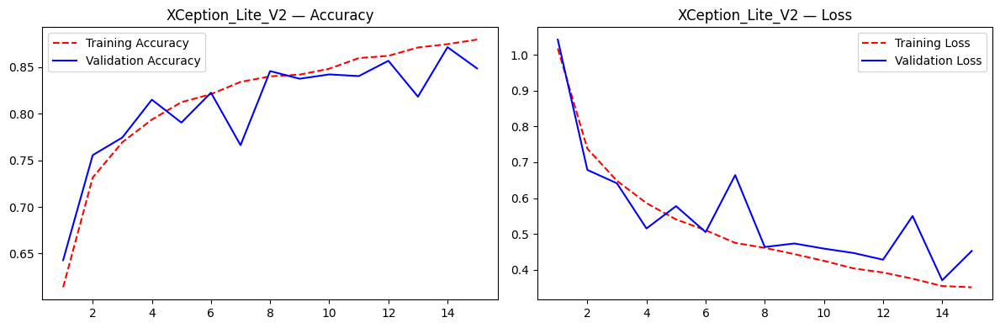

94/94 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.8697 - loss: 0.3885
[XCeption_Lite_V2] Test accuracy: 0.870 | Test loss: 0.388


In [25]:
history, best_model = train_and_evaluate(model, "XCeption_Lite_V2", train_dataset, val_dataset, test_dataset)

# 7. Transfer Learning — Pretrained Xception-41 (frozen head, then fine-tuned)

This section builds separate 299x299 datasets (matching the pretrained backbone's native
resolution) and uses `keras_hub`'s `ImageConverter` for the model's expected
normalization, instead of the simple `Rescaling(1/255)` used in the from-scratch stages
above.

In [26]:
import keras_hub

conv_base = keras_hub.models.Backbone.from_preset("xception_41_imagenet", trainable=False)

In [27]:
image_size_pretrained = (299, 299)
batch_size_pretrained = 16  # smaller than 32 -- 299x299 images use much more GPU memory

train_dataset_pretrained = image_dataset_from_directory(
    train_dir, validation_split=0.2, subset="training",
    seed=seed, image_size=image_size_pretrained, batch_size=batch_size_pretrained,
)
val_dataset_pretrained = image_dataset_from_directory(
    train_dir, validation_split=0.2, subset="validation",
    seed=seed, image_size=image_size_pretrained, batch_size=batch_size_pretrained,
)
test_dataset_pretrained = image_dataset_from_directory(
    test_dir, image_size=image_size_pretrained, batch_size=batch_size_pretrained, shuffle=False,
)

preprocessor = keras_hub.layers.ImageConverter.from_preset(
    "xception_41_imagenet", image_size=image_size_pretrained,
)

train_dataset_pretrained = train_dataset_pretrained.map(
    lambda x, y: (preprocessor(x), y), num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE)
val_dataset_pretrained = val_dataset_pretrained.map(
    lambda x, y: (preprocessor(x), y), num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE)
test_dataset_pretrained = test_dataset_pretrained.map(
    lambda x, y: (preprocessor(x), y), num_parallel_calls=tf.data.AUTOTUNE
).prefetch(tf.data.AUTOTUNE)

Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.
Found 3000 files belonging to 6 classes.


## 7a. Frozen backbone — train the new classification head only

In [28]:
keras.backend.clear_session()

inputs = keras.Input(shape=(299, 299, 3))
x = conv_base(inputs)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(512, activation="relu")(x)
x = layers.Dropout(0.25)(x)
outputs = layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)

Epoch 1/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 597s 718ms/step - accuracy: 0.8254 - loss: 0.5376 - val_accuracy: 0.8439 - val_loss: 0.5062
Epoch 2/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 407s 580ms/step - accuracy: 0.8831 - loss: 0.3595 - val_accuracy: 0.8831 - val_loss: 0.3380
Epoch 3/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 400s 569ms/step - accuracy: 0.8987 - loss: 0.2938 - val_accuracy: 0.8731 - val_loss: 0.4236
Epoch 4/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 399s 568ms/step - accuracy: 0.9156 - loss: 0.2520 - val_accuracy: 0.8956 - val_loss: 0.3537
Epoch 5/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 400s 569ms/step - accuracy: 0.9231 - loss: 0.2261 - val_accuracy: 0.8835 - val_loss: 0.3614
Epoch 6/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 399s 568ms/step - accuracy: 0.9425 - loss: 0.1739 - val_accuracy: 0.8674 - val_loss: 0.4476
Epoch 7/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 400s 570ms/step - accuracy: 0.9452 - loss: 0.1602 - val_accuracy: 0.8967 - val_loss: 0.3586
Epoch 8/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 405s 577ms/step - accuracy: 0.9483 -

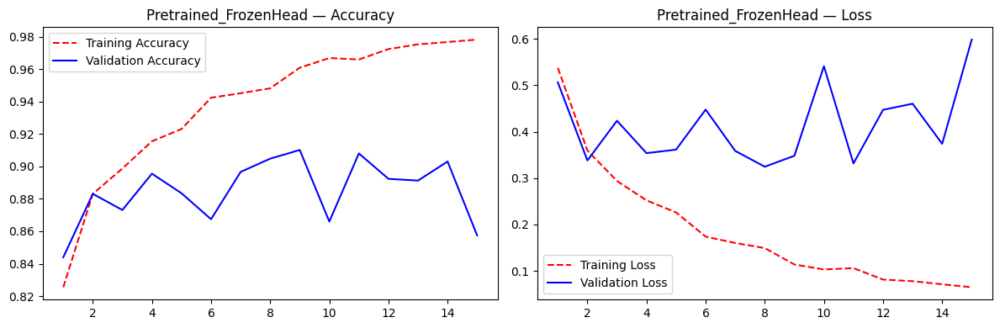

188/188 ━━━━━━━━━━━━━━━━━━━━ 65s 275ms/step - accuracy: 0.8923 - loss: 0.3595
[Pretrained_FrozenHead] Test accuracy: 0.892 | Test loss: 0.359


In [29]:
history, best_model = train_and_evaluate(
    model, "Pretrained_FrozenHead",
    train_dataset_pretrained, val_dataset_pretrained, test_dataset_pretrained,
    epochs=15, learning_rate=1e-3,
)

## 7b. Fine-tuning — unfreeze the backbone (batchnorm layers stay frozen), continue at a much lower learning rate

Continues training the *same* `model` object from 7a, so it starts from the already-trained
head rather than random weights.

In [30]:
conv_base.trainable = True
for layer in conv_base.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

Epoch 1/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 457s 596ms/step - accuracy: 0.9756 - loss: 0.0740 - val_accuracy: 0.9166 - val_loss: 0.3212
Epoch 2/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 363s 517ms/step - accuracy: 0.9884 - loss: 0.0339 - val_accuracy: 0.9209 - val_loss: 0.3140
Epoch 3/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 361s 514ms/step - accuracy: 0.9936 - loss: 0.0215 - val_accuracy: 0.9234 - val_loss: 0.3181
Epoch 4/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 361s 515ms/step - accuracy: 0.9950 - loss: 0.0155 - val_accuracy: 0.9266 - val_loss: 0.3271
Epoch 5/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 361s 514ms/step - accuracy: 0.9965 - loss: 0.0117 - val_accuracy: 0.9252 - val_loss: 0.3319
Epoch 6/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 361s 515ms/step - accuracy: 0.9980 - loss: 0.0082 - val_accuracy: 0.9273 - val_loss: 0.3453
Epoch 7/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 362s 515ms/step - accuracy: 0.9986 - loss: 0.0061 - val_accuracy: 0.9277 - val_loss: 0.3579
Epoch 8/15
702/702 ━━━━━━━━━━━━━━━━━━━━ 362s 515ms/step - accuracy: 0.9993 -

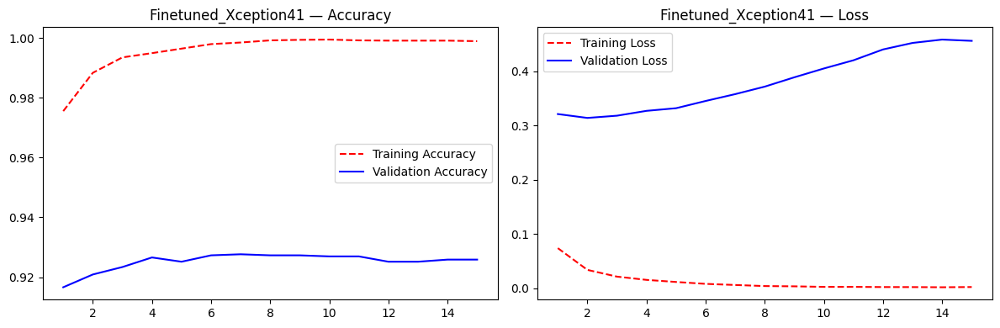

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 318 variables whereas the saved optimizer has 158 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


188/188 ━━━━━━━━━━━━━━━━━━━━ 53s 212ms/step - accuracy: 0.9097 - loss: 0.3674
[Finetuned_Xception41] Test accuracy: 0.910 | Test loss: 0.367


In [31]:
history, best_model = train_and_evaluate(
    model, "Finetuned_Xception41",
    train_dataset_pretrained, val_dataset_pretrained, test_dataset_pretrained,
    epochs=15, learning_rate=1e-5,
)

# Results Summary

In [32]:
results_df = pd.DataFrame(results).T.sort_values("Test Accuracy", ascending=False)
results_df

,Test Accuracy,Test Loss
Finetuned_Xception41,0.910,0.367
Pretrained_FrozenHead,0.892,0.359
XCeption_Lite_V2,0.870,0.388
Base_CNN_Model,0.856,0.425
Batch_Normalization_Added,0.854,0.430
Depthwise_Separable_Added,0.840,0.466
XCeption_Lite_V1,0.828,0.451
Residual_Added,0.827,0.509


## Future Work

- Fine-tune only the last N blocks of the backbone rather than the whole thing, and compare
- Try a learning-rate schedule (e.g. cosine decay) during fine-tuning
- PyTorch re-implementation of the best-performing architecture, for comparison across frameworks